In [1]:
%matplotlib inline
import librosa, matplotlib.pyplot as plt, IPython.display as ipd, numpy
import scipy.spatial

# Music Structure Analysis

In progress.

Method:

- self similarity matrix

In [2]:
y, sr = librosa.load('audio/brahms_hungarian_dance_5.mp3')

In [3]:
ipd.Audio(y, rate=sr)

### Chroma

In [4]:
hop_length = 8000
n_fft = 2**14

In [5]:
chroma = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length, n_fft=n_fft)

In [6]:
chroma.shape

(12, 628)

### MFCC

In [7]:
mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=10, hop_length=hop_length, n_fft=n_fft)

In [8]:
mfcc.shape

(10, 628)

### Self Similarity

In [9]:
self_similarity = scipy.spatial.distance_matrix(mfcc.T, mfcc.T, p=1)

In [10]:
self_similarity.shape

(628, 628)

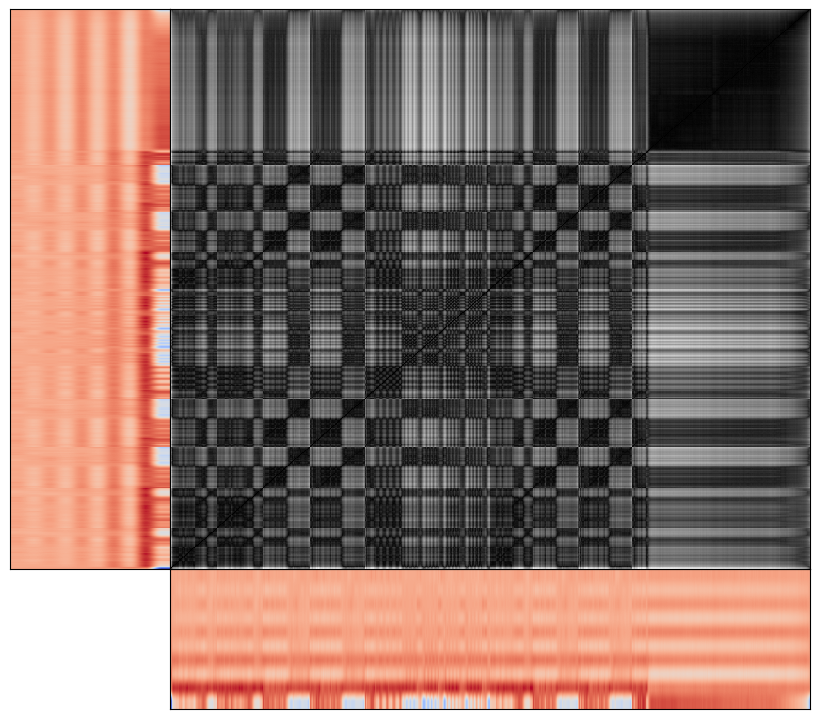

In [11]:
plt.figure(figsize=(8, 7))

# Bottom right plot.
ax1 = plt.axes([0.2, 0, 0.8, 0.20])
ax1.imshow(mfcc, origin='lower', aspect='auto', cmap='coolwarm')
#ax1.set_xlabel('Chroma')
ax1.set_xticks([])
ax1.set_yticks([])
#ax1.set_ylim(20)

# Top left plot.
ax2 = plt.axes([0, 0.2, 0.20, 0.8])
ax2.imshow(mfcc.T[:,::-1], origin='lower', aspect='auto', cmap='coolwarm')
#ax2.set_ylabel('Signal 2')
ax2.set_xticks([])
ax2.set_yticks([])
#ax2.set_ylim(20)

# Top right plot.
#ax3 = plt.axes([0.2, 0.2, 0.8, 0.8], sharex=ax1, sharey=ax2)
ax3 = plt.axes([0.2, 0.2, 0.8, 0.8])
ax3.imshow(self_similarity.T, aspect='auto', origin='lower', interpolation='nearest', cmap='gray')
ax3.set_xticks([])
ax3.set_yticks([]);

Path enhancement 

1. diagonal smoothing
1. multiple filtreing
1. thresholding every element
1. scaling and penalty

Path extraction

## Novelty based segmentation

checkerboard kernel along the main diagonal

Take a first-order difference along each row.

In [12]:
similarity_delta = librosa.feature.delta(self_similarity, width=11, axis=1)

In [13]:
similarity_delta.shape

(628, 628)

In [14]:
similarity_diff = abs(similarity_delta)

In [15]:
similarity_diff = abs(numpy.diff(self_similarity))

In [16]:
similarity_diff.shape

(628, 627)

Sum the absolute values of the differences across columns.

In [17]:
novelty = similarity_diff.sum(axis=0)

In [18]:
novelty.shape

(627,)

Normalize novelty curve.

In [19]:
novelty = novelty/novelty.max()

In [20]:
novelty.max()

1.0

In [21]:
novelty.min()

0.004076689633360075

Peak pick.

In [22]:
min_segment_length_sec = 10
min_segment_length_frames = librosa.time_to_frames(10, sr=sr, hop_length=hop_length, n_fft=n_fft)
min_segment_length_frames

array(26)

In [23]:
peaks = librosa.onset.onset_detect(onset_envelope=novelty, hop_length=hop_length, 
                                   pre_max=11, post_max=11,
                                   pre_avg=11, post_avg=11,
                                   wait=min_segment_length_frames)
peaks

array([  1,  45,  90, 136, 168, 211, 255, 297, 335, 368, 399, 430, 466,
       626])

Plot.

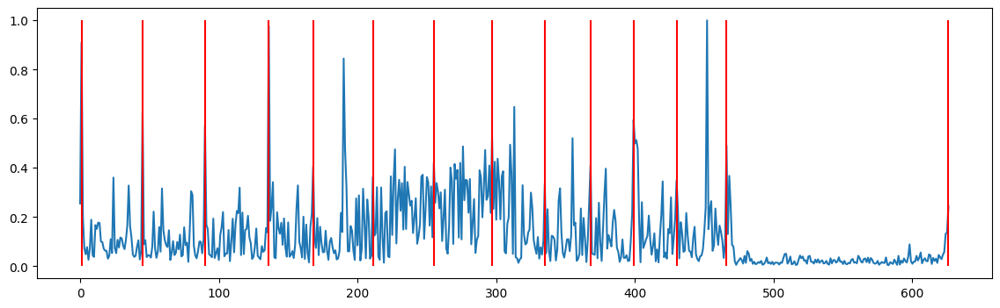

In [24]:
plt.figure(figsize=(14, 4))
plt.plot(novelty)
plt.vlines(peaks, 0, 1, colors='r');

In [25]:
librosa.frames_to_time(peaks, sr=sr, hop_length=hop_length)

array([  0.36281179,  16.32653061,  32.65306122,  49.34240363,
        60.95238095,  76.55328798,  92.5170068 , 107.75510204,
       121.54195011, 133.51473923, 144.76190476, 156.00907029,
       169.07029478, 227.12018141])